## Import Libraries and Data

In [1]:
import pandas as pd
from geonamescache import GeonamesCache
from unidecode import unidecode
import re
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from sklearn.cluster import DBSCAN

In [2]:
data = pd.read_csv('Checkpoint_02.csv', index_col=0)
data.head()

,key,city,country,population,latitude,longitude
0,292223,Dubai,AE,2956587,25.07725,55.30927
1,616052,Yerevan,AM,1093485,40.18111,44.51361
2,2240449,Luanda,AO,2776168,-8.83682,13.23432
3,3651438,Santa Elena,EC,42214,-2.22622,-80.85873
4,3911925,La Paz,BO,812799,-16.50000,-68.15000


## Find Number of Clusters for KMeans

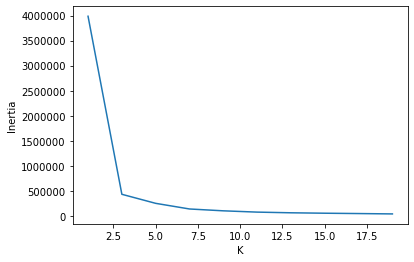

In [3]:
k_values = range(1, 20, 2)
inertia_values = [KMeans(k).fit(data[['latitude', 'longitude']]).inertia_
                  for k in k_values]

plt.plot(k_values, inertia_values)
plt.xlabel('K')
plt.ylabel('Inertia')
plt.show()

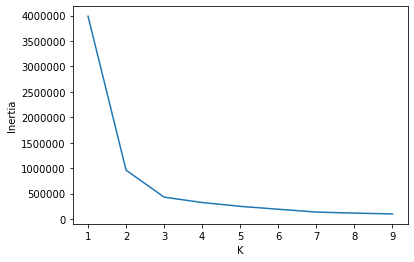

In [4]:
k_values = range(1, 10, 1)
inertia_values = [KMeans(k).fit(data[['latitude', 'longitude']]).inertia_
                  for k in k_values]

plt.plot(k_values, inertia_values)
plt.xlabel('K')
plt.ylabel('Inertia')
plt.show()

## K-Means Clustering

In [5]:
cluster_model = KMeans(n_clusters=3)

In [6]:
clusters = cluster_model.fit_predict(data[['latitude', 'longitude']])

In [7]:
map_plotter = Basemap()

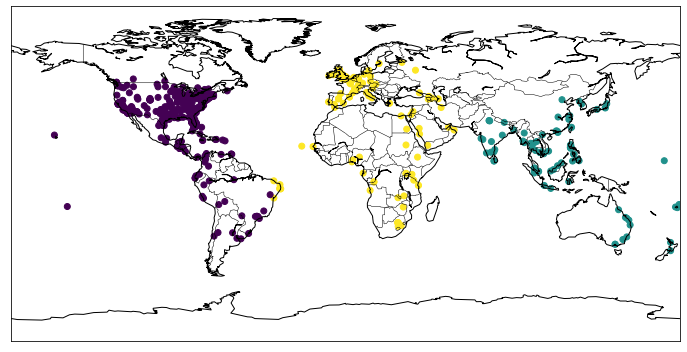

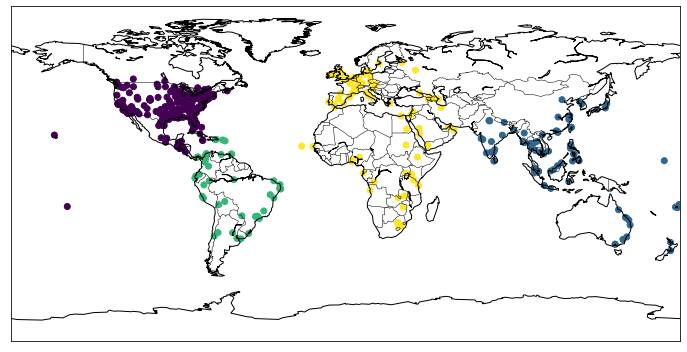

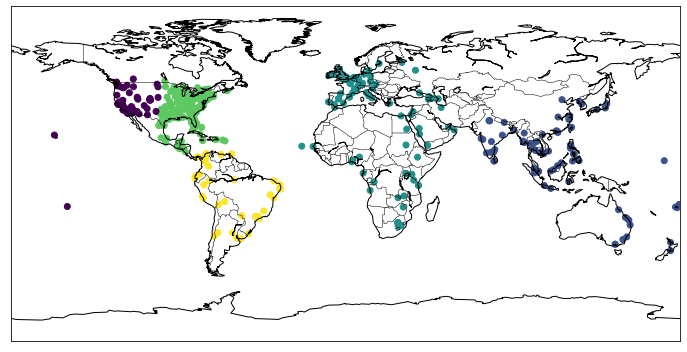

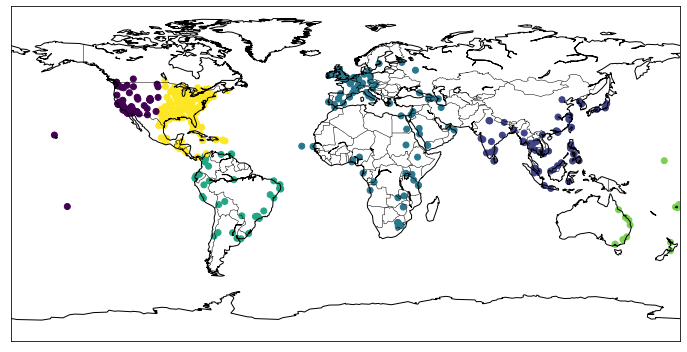

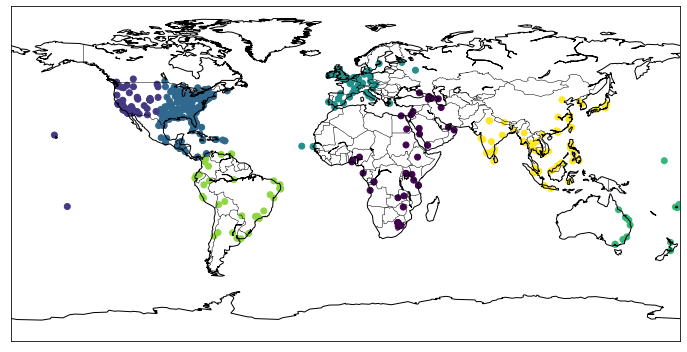

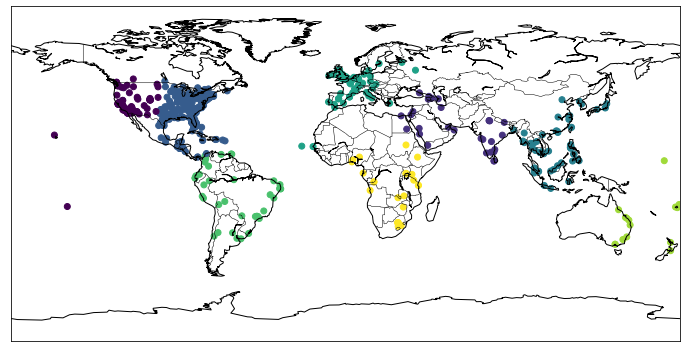

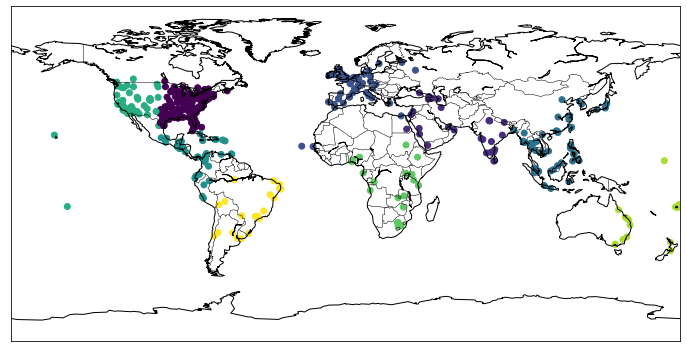

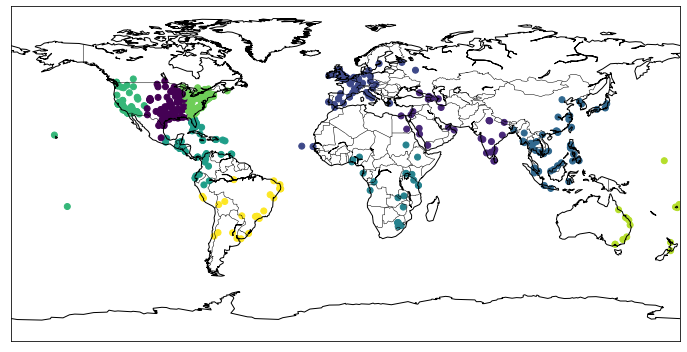

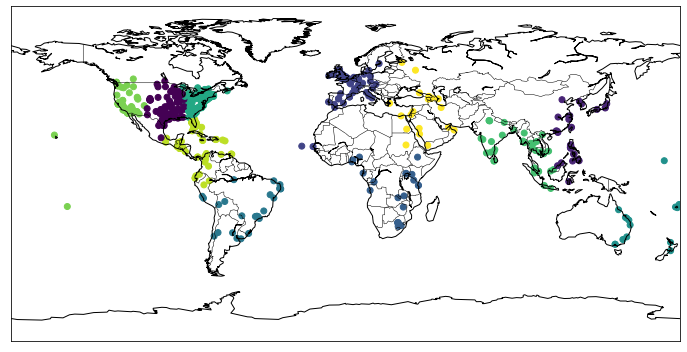

In [8]:
k_values = range(3, 12, 1)
for k in k_values:
    cluster_model = KMeans(n_clusters=k)
    clusters = cluster_model.fit_predict(data[['latitude', 'longitude']])
    fig = plt.figure(figsize=(12, 8))
    map_plotter.drawcoastlines()
    map_plotter.drawcountries()
    map_plotter.scatter(data['longitude'],data['latitude'],latlon=True, c=clusters)
    plt.show()


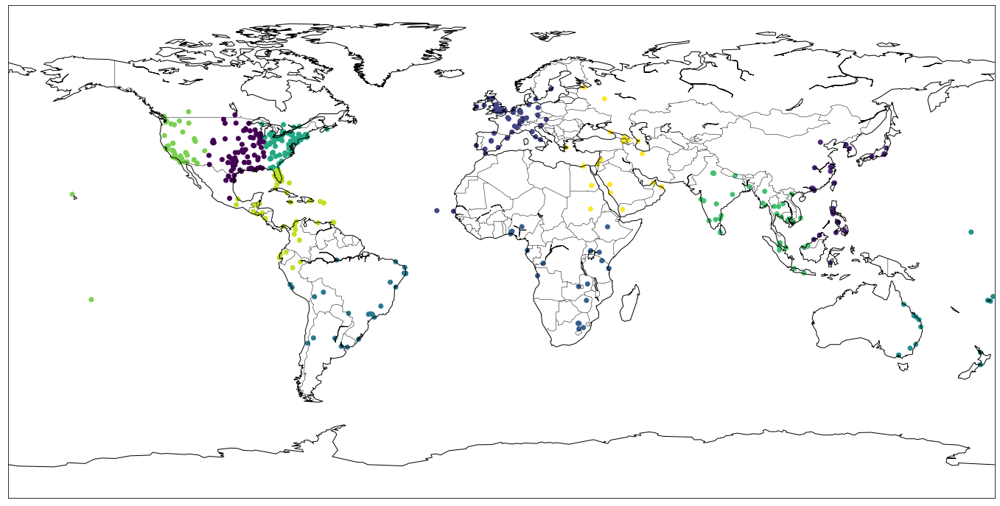

In [9]:
fig = plt.figure(figsize=(24, 16))
map_plotter.drawcoastlines()
map_plotter.drawcountries()
map_plotter.scatter(data['longitude'],data['latitude'],latlon=True, c=clusters)
plt.show()

## Clustering with DBSCAN

In [10]:
epsilon=0.04
min_points = 3
cluster_model = DBSCAN(eps=epsilon, 
                       min_samples=min_points,
                       #algorithm='ball_tree',
                       metric='haversine')
headline_clusters = cluster_model.fit_predict(np.radians(data[['longitude', 'latitude']]))

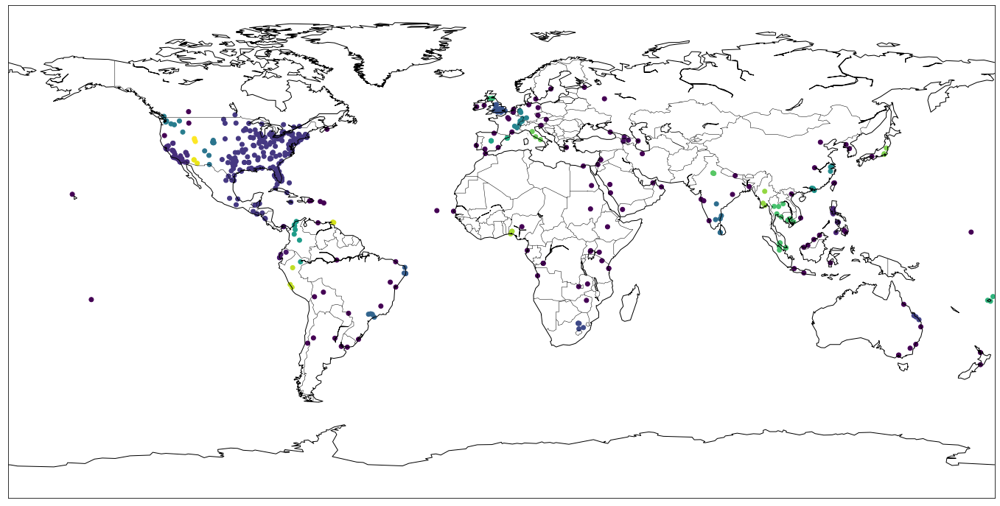

In [11]:
fig = plt.figure(figsize=(24, 16))
map_plotter.drawcoastlines()
map_plotter.drawcountries()
map_plotter.scatter(data['longitude'],data['latitude'],latlon=True, c=headline_clusters)
plt.show()

In [12]:
data['clusters'] = headline_clusters

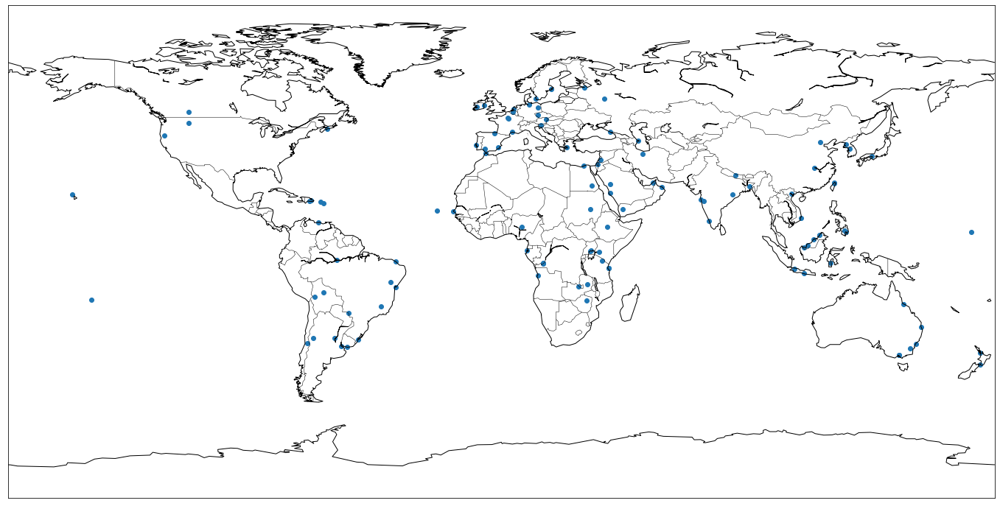

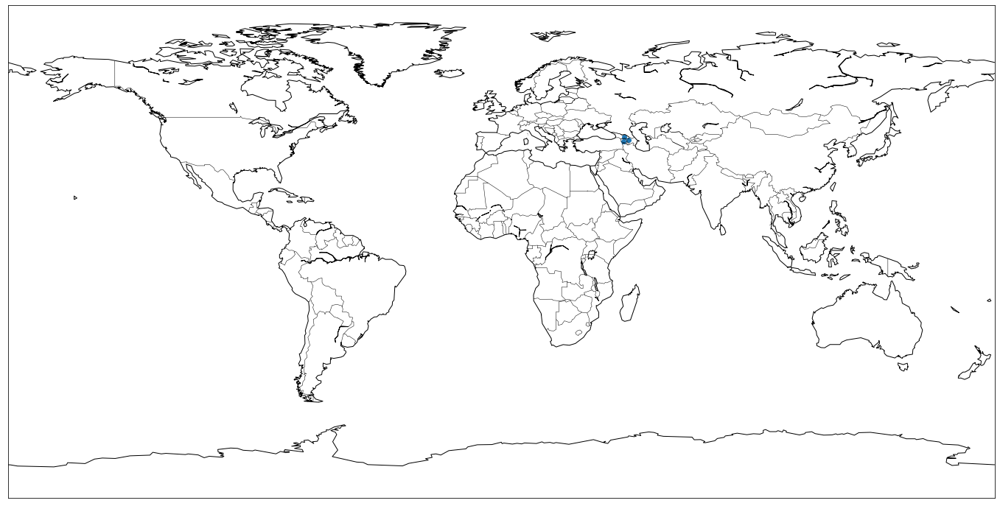

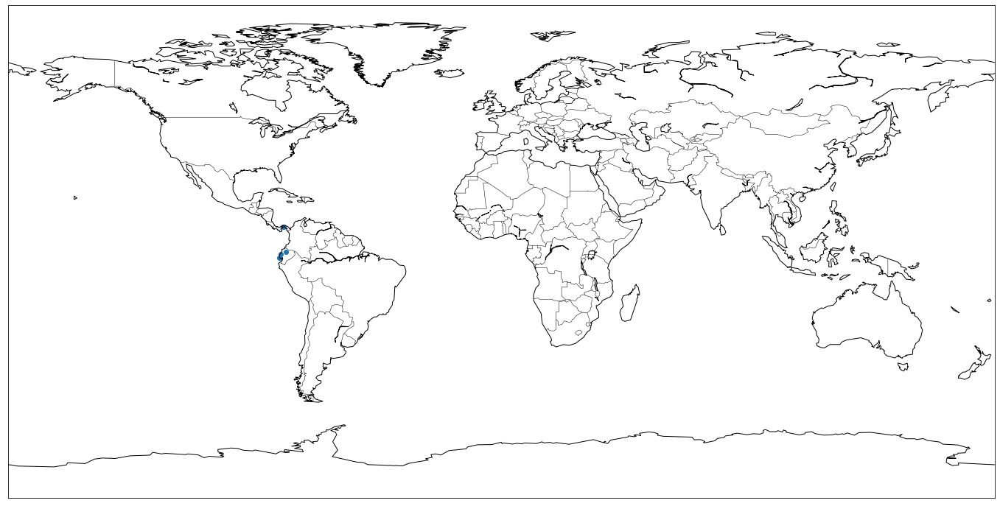

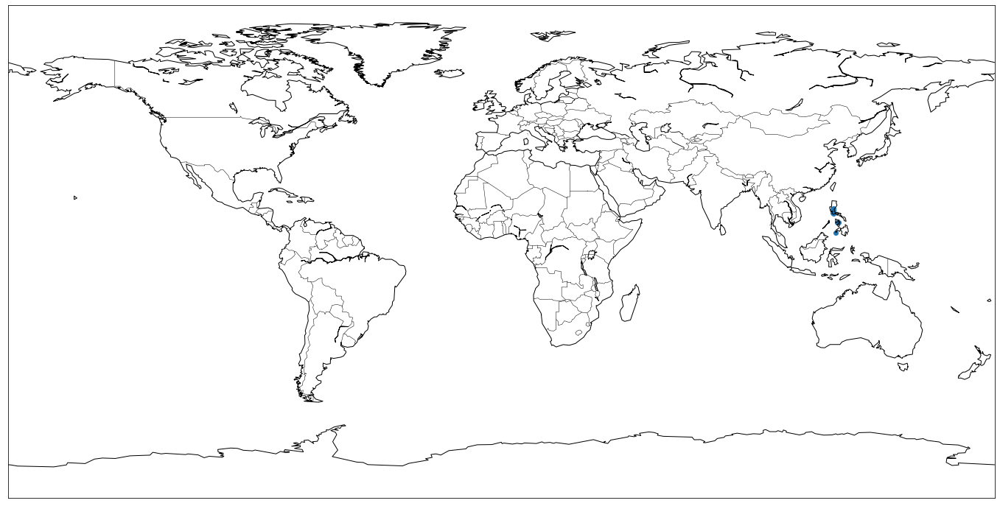

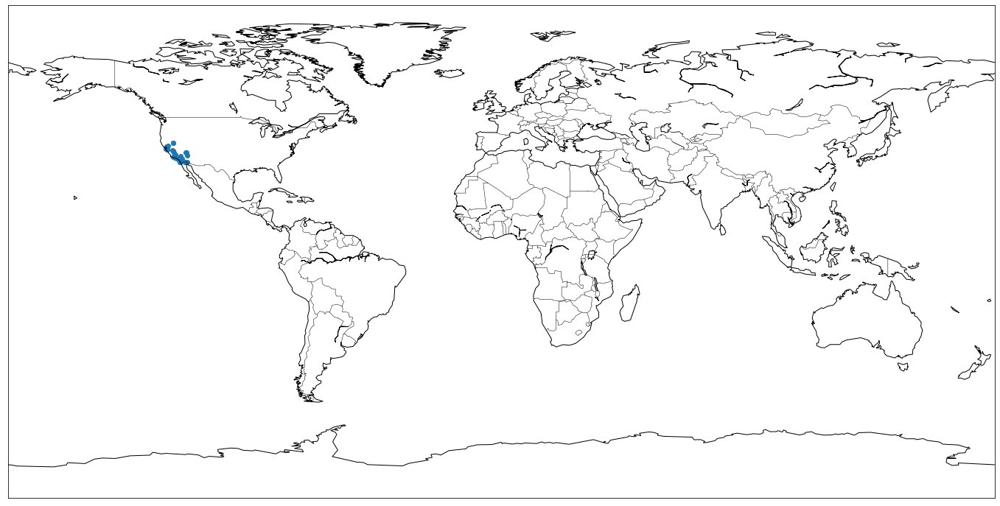

...

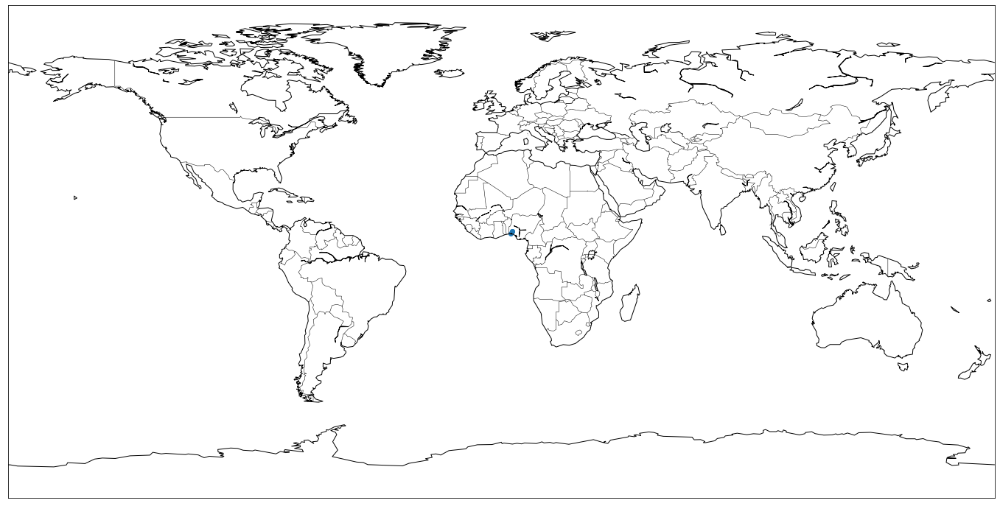

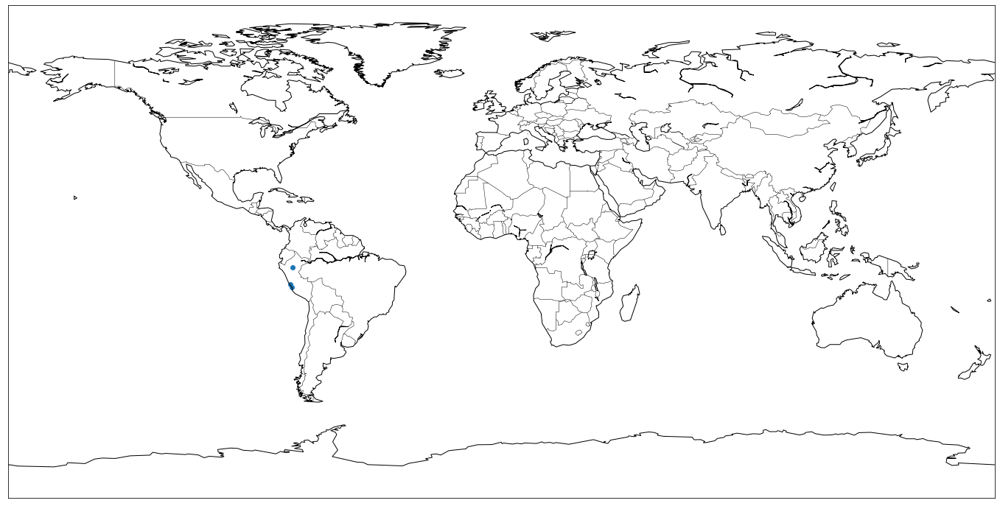

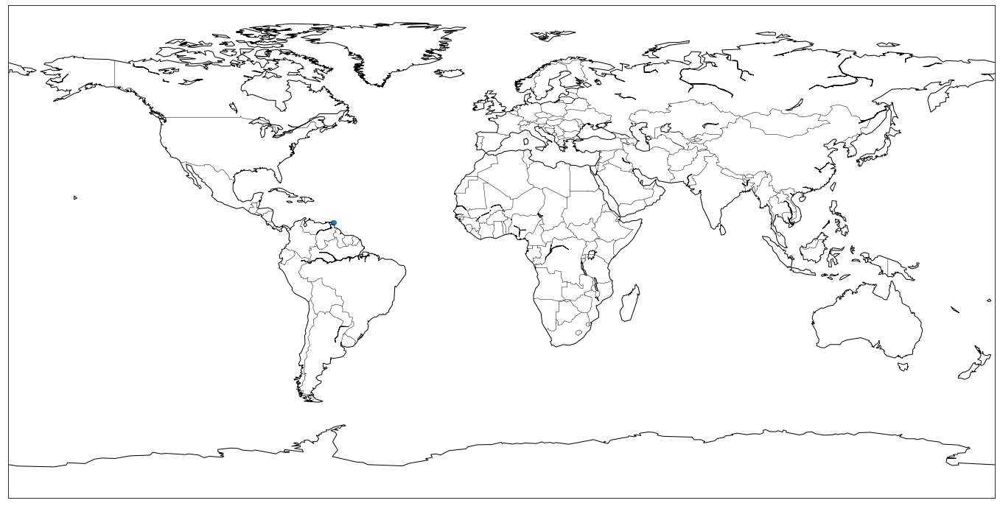

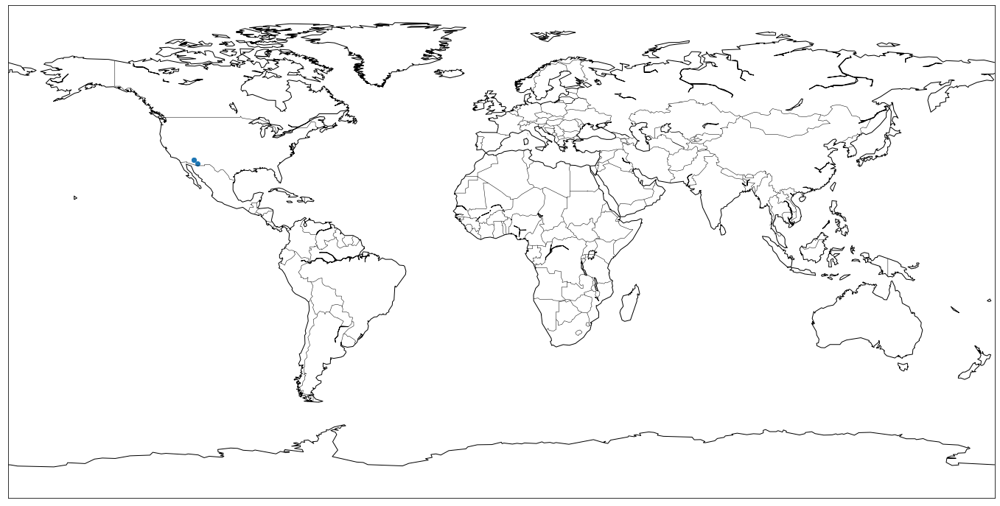

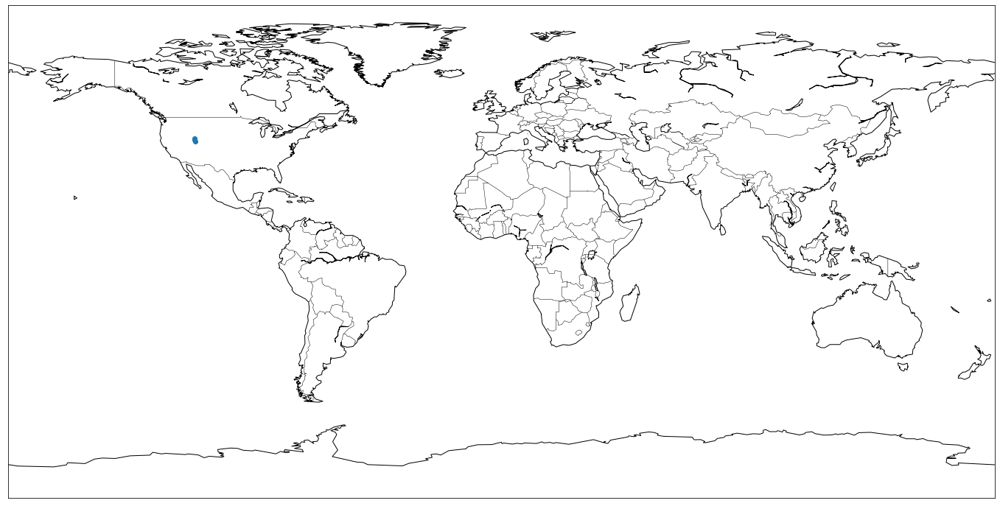

In [13]:
for cl in np.unique(headline_clusters):
    x_coor = data[data['clusters']==cl]['longitude']
    y_coor = data[data['clusters']==cl]['latitude']
    fig = plt.figure(figsize=(24, 16))
    map_plotter.drawcoastlines()
    map_plotter.drawcountries()
    map_plotter.scatter(x_coor, y_coor, latlon=True)
    plt.show()

In [14]:
data.groupby(clusters).count()

,key,city,country,population,latitude,longitude,clusters
0,92,92,92,92,92,92,92
1,39,39,39,39,39,39,39
2,59,59,59,59,59,59,59
3,23,23,23,23,23,23,23
4,24,24,24,24,24,24,24
5,15,15,15,15,15,15,15
6,114,114,114,114,114,114,114
7,40,40,40,40,40,40,40
8,78,78,78,78,78,78,78
9,77,77,77,77,77,77,77


In [15]:
data.head()

,key,city,country,population,latitude,longitude,clusters
0,292223,Dubai,AE,2956587,25.07725,55.30927,-1
1,616052,Yerevan,AM,1093485,40.18111,44.51361,0
2,2240449,Luanda,AO,2776168,-8.83682,13.23432,-1
3,3651438,Santa Elena,EC,42214,-2.22622,-80.85873,1
4,3911925,La Paz,BO,812799,-16.50000,-68.15000,-1


In [16]:
data.to_csv('Checkpoint03.csv', index=False)